In [3]:
! pip install pyedflib

In [110]:
import numpy as np
import pyedflib
from matplotlib import pyplot as plt

import csv
import pywt
import scipy.stats as sp

from os import listdir
from os.path import isfile, join

In [5]:
import pyedflib
import numpy as np
f = pyedflib.EdfReader("ST7201J0-PSG.edf")
n = f.signals_in_file
signal_labels = f.getSignalLabels()
print(n)
print(signal_labels)


5
['EEG Fpz-Cz', 'EEG Pz-Oz', 'EOG horizontal', 'EMG submental', 'Marker']


In [6]:
print(f.file_duration)

29120


In [7]:
import pandas as pd
df1 = pd.read_csv("lim_data/ST7201J0-PSG_data.csv")
print(df1.head(10))

   Time          1          2          3          4     5
0  0.00  23.622047  23.622047  23.622047  23.622047 -30.0
1  0.01  23.622047  23.622047  23.622047  23.622047   NaN
2  0.02  23.622047  23.622047  23.622047  23.622047   NaN
3  0.03  23.622047  23.622047  23.622047  23.622047   NaN
4  0.04  23.622047  23.622047  23.622047  23.622047   NaN
5  0.05  23.622047  23.622047  23.622047  23.622047   NaN
6  0.06  23.622047  23.622047  23.622047  23.622047   NaN
7  0.07  23.622047  23.622047  23.622047  23.622047   NaN
8  0.08  23.622047  23.622047  23.622047  23.622047   NaN
9  0.09  23.622047  23.622047  23.622047  23.622047   NaN


In [8]:
data_arr = np.array(df1)

In [16]:
print(df1.loc[0][1])

23.622047


In [9]:
df2 = pd.read_csv("lim_data/ST7201JO-Hypnogram_annotations.csv")
print(df2.head(10))

   Onset  Duration     Annotation
0   1410       390  Sleep stage 1
1   1800       240  Sleep stage 2
2   2040        30  Sleep stage W
3   2070        60  Sleep stage 1
4   2130       420  Sleep stage 2
5   2550        60  Sleep stage 3
6   2610        30  Sleep stage 2
7   2640        90  Sleep stage 3
8   2730        30  Sleep stage 2
9   2760        60  Sleep stage 3


In [10]:
time_marker = np.array(df2['Onset'])
label = np.array(df2['Annotation'])
for i in range(len(label)):
    label[i] = label[i][-1:]

In [33]:
time_marker[0]
label[2]

'W'

In [11]:
data_arr[0][5]
print(len(data_arr))

2912000


In [47]:
data_arr[0][0]

0.0

In [12]:
print(len(label))

137


In [14]:
X = []
y = []
idx = 1
last_mark = time_marker[idx]
ch1 = []
ch2 = []
ch3 = []
ch4 = []
for i in range(len(data_arr)-1000):
    if idx >=130 :
        break
    if data_arr[i+1][0] > last_mark:
        #print('haha')
        # zip
        tot_ch = [ch1[:], ch2[:], ch3[:], ch4[:]]
        print(tot_ch[0])
        X.append(tot_ch[:])
        #print(X[0][1])
        y.append(label[idx-1])
        ch1[:] = []
        ch2[:] = []
        ch3[:] = []
        ch4[:] = []
        idx += 1
        last_mark = time_marker[idx]
    else:
        ch1.append(data_arr[i][1])
        ch2.append(data_arr[i][2])
        ch3.append(data_arr[i][3])
        ch4.append(data_arr[i][4])

[23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047, 23.622047

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


[101.26350500000001, 99.06610500000001, 102.362205, 104.55960400000001, 100.531038, 91.741439, 81.48690699999999, 83.318074, 86.614173, 99.432338, 99.798572, 98.333639, 95.037539, 96.502472, 89.910273, 93.938839, 99.432338, 108.954404, 104.55960400000001, 95.770005, 95.770005, 86.614173, 88.44534, 100.531038, 100.164805, 99.798572, 93.938839, 98.333639, 95.037539, 94.305072, 80.388207, 80.388207, 81.85314, 77.824574, 79.655741, 83.318074, 82.219374, 78.19080799999999, 74.16224100000001, 69.767442, 60.245376, 62.07654300000001, 64.273943, 68.66874200000001, 74.528475, 78.557041, 70.133675, 71.964842, 63.541476, 59.879143000000006, 54.751877, 47.793444, 45.596045000000004, 61.344076, 75.260941, 79.655741, 74.894708, 67.936275, 65.372642, 63.175243, 56.949277, 61.344076, 65.372642, 65.738876, 67.936275, 66.105109, 59.51291, 56.216809999999995, 56.949277, 54.38564399999999, 55.118109999999994, 52.554477, 52.188244, 42.666178, 41.567478, 40.835012, 39.736312, 39.003845, 42.299945, 46.694745

[-45.229811, -29.848013, -25.819447, -21.424648, -19.593481, -19.593481, -19.959714, -21.058414000000003, -25.08698, -21.424648, -10.437649, -2.74675, -10.071415, -29.848013, -40.102545, -48.159678, -55.850577, -54.01941, -55.118109999999994, -58.41421, -64.640176, -58.41421, -56.216809999999995, -63.541476, -67.936275, -67.936275, -69.401209, -75.627175, -75.993408, -75.260941, -78.92327399999999, -90.642739, -102.362205, -103.827138, -107.489471, -111.88427, -123.60373600000001, -138.6193, -145.2115, -158.029665, -159.86083100000002, -161.325765, -157.663432, -149.24006599999998, -144.1128, -133.49203400000002, -123.60373600000001, -107.12323799999999, -103.827138, -99.432338, -107.12323799999999, -103.827138, -103.46090500000001, -88.811573, -78.92327399999999, -73.063541, -73.429775, -75.260941, -71.964842, -67.936275, -65.372642, -55.48434399999999, -50.357077000000004, -46.328511, -43.764878, -47.060978000000006, -44.131112, -33.876579, -30.214246000000003, -27.650613, -32.411646

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


[41.567478, 43.764878, 47.793444, 46.694745000000005, 42.666178, 47.060978000000006, 58.780443000000005, 60.245376, 61.344076, 52.92071, 52.92071, 57.315509999999996, 60.97784300000001, 59.879143000000006, 57.681743000000004, 60.97784300000001, 54.01941, 50.723310999999995, 51.822010999999996, 54.751877, 62.809008999999996, 59.51291, 59.146676, 55.850577, 58.41421, 60.97784300000001, 54.01941, 52.554477, 50.357077000000004, 42.299945, 43.764878, 47.793444, 54.01941, 59.879143000000006, 60.97784300000001, 52.554477, 54.751877, 56.949277, 63.907709, 65.738876, 64.273943, 58.047977, 52.188244, 51.455777000000005, 53.28694399999999, 54.38564399999999, 51.822010999999996, 55.48434399999999, 51.455777000000005, 49.258378, 48.159678, 53.28694399999999, 58.780443000000005, 65.372642, 61.344076, 56.949277, 44.497345, 42.299945, 44.863578000000004, 42.666178, 45.962278000000005, 42.299945, 45.229811, 47.060978000000006, 47.793444, 47.793444, 47.060978000000006, 51.455777000000005, 63.907709, 65.

[-14.466215, -24.354514, -31.67918, -30.946713, -18.861014, -13.001282000000002, -15.198682000000002, -22.889581, -30.946713, -31.312946000000004, -22.157114, -11.902582, 4.577916, 8.606482000000002, -0.54935, -13.001282000000002, -24.720747, -29.115546999999996, -18.494781, 0.54935, 5.310383, -2.380516, -25.819447, -43.032412, -54.751877, -54.38564399999999, -36.440212, -21.424648, -18.861014, -21.424648, -43.764878, -59.51291, -66.105109, -62.442776, -44.497345, -41.567478, -35.341513, -42.299945, -51.455777000000005, -54.38564399999999, -51.822010999999996, -50.357077000000004, -50.357077000000004, -46.694745000000005, -51.455777000000005, -58.047977, -60.245376, -58.780443000000005, -51.089544000000004, -37.905146, -30.946713, -31.67918, -43.032412, -60.97784300000001, -72.69730799999999, -65.372642, -37.905146, -21.424648, -22.889581, -35.341513, -40.468779, -48.892144, -46.328511, -35.707746, -28.016847, -13.001282000000002, -8.240249, -7.507782000000001, -13.001282000000002, -10

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


[-18.861014, -18.861014, -17.762315, -15.198682000000002, -18.494781, -15.564915, -17.762315, -17.396081, -19.593481, -22.523347, -28.749313, -25.819447, -23.988281, -23.622047, -30.214246000000003, -29.115546999999996, -34.242813, -35.707746, -39.736312, -40.102545, -39.370079, -39.736312, -38.637612, -42.666178, -42.666178, -37.172678999999995, -39.003845, -37.905146, -32.045413, -29.848013, -25.819447, -26.185679999999998, -27.28438, -26.551914, -23.622047, -30.946713, -27.650613, -28.749313, -29.848013, -30.580479999999998, -38.271378999999996, -38.637612, -41.201245, -40.835012, -38.271378999999996, -35.341513, -37.172678999999995, -36.440212, -42.666178, -38.271378999999996, -38.271378999999996, -34.242813, -39.003845, -36.440212, -38.637612, -42.299945, -36.073979, -34.975279, -29.848013, -23.255814, -33.876579, -34.242813, -39.370079, -38.271378999999996, -44.497345, -39.736312, -41.201245, -43.764878, -45.962278000000005, -49.624611, -43.764878, -44.863578000000004, -46.694745

[-4.211683, -6.0428489999999995, -3.4792160000000005, -2.380516, -7.507782000000001, -5.676616, -6.409083, -7.141549, -4.577916, -10.071415, -17.029848, -6.775316, -9.705182, -8.240249, -4.9441489999999995, 7.141549, 2.74675, 4.211683, -5.676616, 7.141549, -1.64805, -13.001282000000002, -6.409083, 0.54935, 1.281817, -5.676616, -7.507782000000001, -11.902582, -19.593481, -17.762315, -13.001282000000002, -13.733748, -15.198682000000002, -15.931148, -7.874016, -6.0428489999999995, -10.803882000000002, -14.466215, -27.650613, -24.720747, -32.411646000000005, -36.073979, -40.102545, -37.905146, -37.905146, -31.312946000000004, -29.48178, -23.988281, -22.889581, -26.185679999999998, -25.08698, -17.762315, -19.227248, -17.029848, -13.733748, -10.071415, -12.268815, -7.874016, -1.64805, -3.4792160000000005, -6.775316, -14.832448000000001, -19.593481, -24.354514, -30.214246000000003, -30.946713, -40.102545, -35.341513, -30.946713, -29.115546999999996, -22.889581, -22.523347, -30.214246000000003

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [58]:
print(y)

['1', '2', 'W', '1', '2', '3', '2', '3', '2', '3', '2', '3', '2', '3', '2', '4', '2', '3', '2', '3', '4', '3', '2', '4', '3', '4', '3', '2', '3', '4', '3', '4', '3', '4', '3', '4', '3', '4', '3', '2', '3', '4', '3', '4', '3', '4', '3', '4', '3', '4', '3', '4', '3', '4', '3', '4', '3', 'W', '1', '2', 'R', '2', 'e', '2', '3', '2', '1', '2', '3', '2', '3', '2', '1', '2', '1', '2', 'R', 'W', '1', '2', 'R', 'W', '1', 'R', '1', '2', '1', '2', '1', '2', '3', '2', '3', 'W', '1', '2', '3', '2', '1', '2', 'R', 'W', '1', '2', '1', '2', '1', 'W', '1', '2', '1', '2', '1', '2', '1', '2', '1', '2', 'W', '1', '2', 'R', 'e', 'R', 'W', '1', 'R', 'W', '1']


In [26]:
print(len(X[7][3]))

8999


In [29]:
len(X)

129

In [30]:
len(y)

129

In [36]:
X_data = X[2:122]
y_label = y[2:122]

In [39]:
print(len(X_data))
print(len(y_label))

120
120


In [45]:
import matplotlib.pyplot as plt

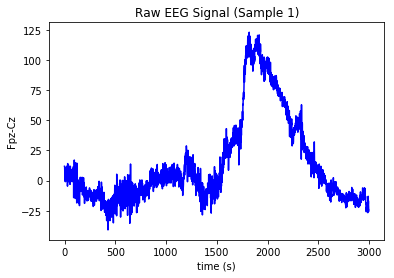

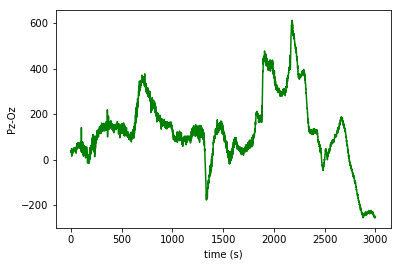

In [78]:

plt.plot(X_data[0][1], 'b-')
plt.title('Raw EEG Signal (Sample 1)')
plt.xlabel('time (s)')
plt.ylabel('Fpz-Cz')

plt.show()

plt.plot(X_data[0][2], 'g-')
plt.xlabel('time (s)')
plt.ylabel('Pz-Oz')
plt.savefig('plot2.png')


plt.show()
#plt.savefig('plot1.png')

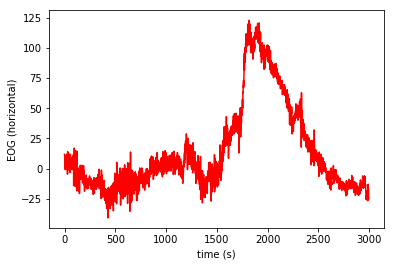

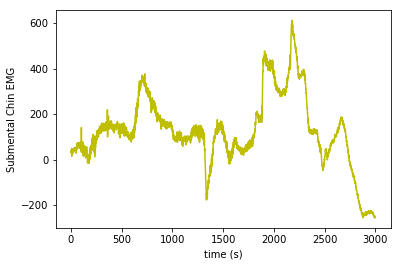

In [79]:

plt.plot(X_data[0][1], 'r-')
plt.xlabel('time (s)')
plt.ylabel('EOG (horizontal)')

plt.show()
plt.plot(X_data[0][2], 'y-')
plt.xlabel('time (s)')
plt.ylabel('Submental Chin EMG')
plt.show()


In [184]:

plt.plot(X_data[1][1], 'b-')
plt.title('Raw EEG Signal (Sample 2)')
plt.xlabel('time (s)')
plt.ylabel('Fpz-Cz')

#plt.show()

plt.plot(X_data[1][2], 'g-')
plt.xlabel('time (s)')
plt.ylabel('Pz-Oz')
plt.savefig('plot2.png')


#plt.show()
plt.savefig('plot1.png')


plt.plot(X_data[1][1], 'r-')
plt.xlabel('time (s)')
plt.ylabel('EOG (horizontal)')

#plt.show()
plt.plot(X_data[1][2], 'y-')
plt.xlabel('time (s)')
plt.ylabel('Submental Chin EMG')
#plt.show()
plt.savefig('plot2.png')

In [82]:
for i in range(len(X_data)):
    print(len(X_data[i][0]))

2999
5999
41999
5999
2999
8999
2999
5999
2999
11999
2999
17999
2999
2999
2999
5999
2999
2999
5999
2999
2999
2999
5999
2999
8999
2999
2999
11999
5999
2999
2999
2999
2999
2999
2999
2999
2999
2999
2999
2999
2999
5999
5999
2999
20999
2999
5999
11999
14999
2999
11999
5999
2999
2999
5999
5999
2999
143999
11999
137999
2999
56999
2999
11999
2999
89999
8999
146999
2999
20999
5999
8999
2999
17999
44999
2999
5999
14999
44999
2999
2999
20999
2999
20999
2999
128999
5999
53999
2999
101999
2999
2999
5999
86999
2999
2999
2999
59999
71999
5999
17999
20999
2999
11999
2999
8999
20999
11999
5999
65999
2999
5999
2999
17999
2999
188999
2999
5999
8999
38999


In [138]:
def my_kurtosis(a):
    b = a # Extracting the data from the 14 channels
    output = np.zeros(len(b)) # Initializing the output array with zeros (length = 14)
    k = 0; # For counting the current row no.
    for i in b:
        mean_i = np.mean(i) # Saving the mean of array i
        std_i = np.std(i) # Saving the standard deviation of array i
        t = 0.0
        for j in i:
            t += (pow((j-mean_i)/std_i,4)-3)
        kurtosis_i = t/len(i) # Formula: (1/N)*(summation(x_i-mean)/standard_deviation)^4-3
        output[k] = kurtosis_i # Saving the kurtosis in the array created
        k +=1 # Updating the current row no.
    return np.sum(output)/4

##----------------------------------------- End Kurtosis Function ----------------------------##


##------------------------------------- Begin 2ndDiffMean(Absolute difference) Function ------##
##-------------------------- [ Input: 2D array (row: Channels, column: Data)] --------------- ##
##-------------------  -- [ Output: 1D array (2ndDiffMean values for each channel)] ----------##

def secDiffMean(a):
    b = a # Extracting the data of the 14 channels
    output = np.zeros(len(b)) # Initializing the output array with zeros (length = 14)
    temp1 = np.zeros(len(b[0])-1) # To store the 1st Diffs
    k = 0; # For counting the current row no.
    for i in b:
        t = 0.0
        for j in range(len(i)-1):
            temp1[j] = abs(i[j+1]-i[j]) # Obtaining the 1st Diffs
        for j in range(len(i)-2):
            t += abs(temp1[j+1]-temp1[j]) # Summing the 2nd Diffs
        output[k] = t/(len(i)-2) # Calculating the mean of the 2nd Diffs
        k +=1 # Updating the current row no.
    return np.sum(output)/4

##------------------------------------- End 2ndDiffMean Function----- -------------------------##


##------------------------------------- Begin 2ndDiffMax Function(Absolute difference) --------##
##-------------------------- [ Input: 2D array (row: Channels, column: Data)] -----------------##
##--------------------- [ Output: 1D array (2ndDiffMax values for each channel)] --------------##

def secDiffMax(a):
    b = a # Extracting the data from the 14 channels
    output = np.zeros(len(b)) # Initializing the output array with zeros (length = 14)
    temp1 = np.zeros(len(b[0])-1) # To store the 1st Diffs
    k = 0; # For counting the current row no.
    t = 0.0
    for i in b:
        for j in range(len(i)-1):
            temp1[j] = abs(i[j+1]-i[j]) # Obtaining the 1st Diffs
        t = temp1[1] - temp1[0]
        for j in range(len(i)-2):
            if abs(temp1[j+1]-temp1[j]) > t :
                t = temp1[j+1]-temp1[j] # Comparing current Diff with the last updated Diff Max

        output[k] = t # Storing the 2nd Diff Max for channel k
        k +=1 # Updating the current row no.
    return np.sum(output)/4



def wrapper1(a):
    kurtosis =  my_kurtosis(a)
    sec_diff_mean = secDiffMean(a)
    sec_diff_max  = secDiffMax(a)
    return kurtosis,sec_diff_mean,sec_diff_max

In [139]:
def coeff_var(a):
    b = a #Extracting the data from the 14 channels
    output = np.zeros(len(b)) #Initializing the output array with zeros
    k = 0; #For counting the current row no.
    for i in b:
        mean_i = np.mean(i) #Saving the mean of array i
        std_i = np.std(i) #Saving the standard deviation of array i
        output[k] = std_i/mean_i #computing coefficient of variation
        k=k+1
    return np.sum(output)/4

In [102]:
wrapper1(X_data[2])

(1.3119908587195106, 0.8961303688681469, 11.327072571428571)

In [140]:
def skewness(arr):
    data = arr 
    skew_array = np.zeros(len(data)) #Initialinling the array as all 0s
    index = 0; #current cell position in the output array
   
    for i in data:
        skew_array[index]=sp.stats.skew(i,axis=0,bias=True)
        index+=1 #updating the cell position
    return np.sum(skew_array)/4


def first_diff_mean(arr):
    data = arr 
    diff_mean_array = np.zeros(len(data)) #Initialinling the array as all 0s
    index = 0; #current cell position in the output array
   
    for i in data:
        sum=0.0#initializing the sum at the start of each iteration
        for j in range(len(i)-1):
            sum += abs(i[j+1]-i[j]) # Obtaining the 1st Diffs
           
        diff_mean_array[index]=sum/(len(i)-1)
        index+=1 #updating the cell position
    return np.sum(diff_mean_array)/4


def first_diff_max(arr):
    data = arr 
    diff_max_array = np.zeros(len(data)) #Initialinling the array as all 0s
    first_diff = np.zeros(len(data[0])-1)#Initialinling the array as all 0s 
    index = 0; #current cell position in the output array
   
    for i in data:
        max=0.0#initializing at the start of each iteration
        for j in range(len(i)-1):
            first_diff[j] = abs(i[j+1]-i[j]) # Obtaining the 1st Diffs
            if first_diff[j]>max: 
                max=first_diff[j] # finding the maximum of the first differences
        diff_max_array[index]=max
        index+=1 #updating the cell position
    return np.sum(diff_max_array)/4


def wrapper2(arr):
    skew   = skewness(arr)
    fdmean = first_diff_mean(arr)
    fdmax  = first_diff_max(arr)
    return skew,fdmean,fdmax

In [137]:
wrapper2(X_data[0])

(0.032861829431481235, 3.73387457197655, 50.74947028571429)

In [141]:
feature_vec = []
for i in range(len(X_data)):
    w1 = wrapper1(X_data[i])
    w2 = wrapper2(X_data[i])
    new_v = [w1[0], w1[1], w1[2], coeff_var(X_data[i]), w2[0], w2[1], w2[2]]
    feature_vec.append(new_v)

In [144]:
feature_vec[3]

[0.17485454121400695,
 2.6929780734533804,
 18.76945625,
 -15.058577412448061,
 0.028670384647800938,
 3.6674771423808,
 22.798022249999995]

In [142]:
for i in range(len(feature_vec)):
    print(len(feature_vec[i]))


7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7


In [145]:
x = [[1.2, 2.6, 3.1], [4.2, 5, 6]]
y = ['a', '6']
clf = svm.SVC()
clf.fit(x, y)  

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [127]:
x

[[1.2, 2.6, 3.1], [4.2, 5, 6]]

In [172]:
X_train = feature_vec[0:int(len(feature_vec)*0.85)]
X_test = feature_vec[int(len(feature_vec)*0.85):]
y_train = y_label[0:int(len(y_label)*0.85)]
y_test = y_label[int(len(y_label)*0.85):]

In [160]:
X_train[1]

[0.5969969698202027,
 3.034646185467735,
 49.258378,
 -0.04734480662573104,
 0.2409766015214983,
 3.8683315023341303,
 56.3083685]

In [173]:
from sklearn import svm
clf = svm.SVC()
clf.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [174]:
pred = clf.predict(X_test)

In [175]:
tot = 0
cnt = 0
for i in range(len(X_test)):
    if y_test[i] == pred[i]:
        cnt += 1
    tot+=1

In [176]:
print(cnt/tot)

0.3888888888888889


In [178]:
from sklearn.ensemble import RandomForestClassifier

In [179]:
clf = RandomForestClassifier(n_estimators=10)
clf = clf.fit(X_train, y_train)

In [180]:
pred = clf.predict(X_test)

In [181]:
tot = 0
cnt = 0
for i in range(len(X_test)):
    if y_test[i] == pred[i]:
        cnt += 1
    tot+=1
print(cnt/tot)

0.5555555555555556
